### imports

In [1]:
import sys
import os
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Markdown, display

# Caminho da pasta "Twitch"
base_dir = Path(os.getcwd()).resolve().parent  # Ajuste se necessário
# Adicionar as pasta ao sys.path
visualization_dir = base_dir / 'src' / 'visualization'
getData_dir = base_dir / 'src' / 'data'
sys.path.append(str(visualization_dir))
sys.path.append(str(getData_dir))

# Importar os módulos
try:
    import allNodesRegions
    import studyRegion
    import TwitchGraphs
    import TwitchVisualization
except ImportError:
    print("Erro: Não foi possível importar algum módulo. Verifique se o caminho está correto.")

# Paises
countries = ["PTBR", "DE", "ENGB", "ES", "FR", "RU"]

# Configuração de estilo dos gráficos
TwitchGraphs.setup_style()

## Visualização de gráficos

### Definir parâmetros

#### Definir o diretório correto

#### Selecionar o País

In [2]:
# Escolher entre: DE, ENGB, ES, FR, PTBR, RU
country = "RU"

#### Variáveis Extras

In [3]:
# Definir o nome das ficheiros originais
Filedges = "musae_" + country + "_edges.csv"
Filetarget = "musae_" + country + "_target.csv"

# Definir o diretório dos ficheiros originais
edgePath = base_dir / 'data' / country / Filedges
targetPath = base_dir / 'data' / country / Filetarget

# Definir o diretório dos ficheiros tratados e do local das imagens
csv_path = base_dir / 'data' / country / 'processed_data'/ f"twitch_network_analysis_{country}.csv"
output_dir = base_dir / 'docs' / "Imagens"

# Ler o ficheiro CSV
df = pd.read_csv(csv_path)
df

,node,degree,degree_centrality,closeness_centrality,betweenness_centrality,eigenvector_centrality,pagerank_centrality,clustering_coef,louvain_community,lp_community,...,days,mature,views,partner,new_id,username,created_at,profile_pic,broadcaster_type,game_name
0,1076,6,0.001369,0.308342,0.000468,0.001220,0.000143,0.133333,6,0,...,1910,False,2002,False,1076,Iggy5557,2013-05-17,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,World of Warcraft
1,1090,1,0.000228,0.256945,0.000000,0.000051,0.000050,0.000000,6,0,...,2273,True,1885,False,1090,AnnoArincass,2012-07-21,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Minion Masters
2,633,45,0.010265,0.392972,0.001281,0.016432,0.000529,0.105051,1,0,...,998,False,14538,False,633,Blifer,2016-01-16,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Sea of Thieves
3,2238,8,0.001825,0.372599,0.000172,0.008873,0.000125,0.250000,2,0,...,1738,True,8541,False,2238,Wape98,2014-01-07,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Mir Tankov
4,1662,11,0.002509,0.359846,0.000056,0.006519,0.000153,0.145455,3,0,...,1461,False,49854,False,1662,KaverTV,2014-10-12,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Project Zomboid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4380,3249,11,0.002509,0.325561,0.000003,0.003258,0.000140,0.545455,1,0,...,1267,False,31085,False,3249,JoystickNS,2015-04-23,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,VALORANT
4381,2287,14,0.003193,0.354005,0.000128,0.007035,0.000192,0.208791,0,0,...,1244,False,37971,False,2287,LoliRuri,2015-05-17,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Dave the Diver
4382,1095,8,0.001825,0.343789,0.000026,0.005328,0.000125,0.285714,2,0,...,663,False,24686,False,1095,vika_supernova,2016-12-18,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Bloodborne
4383,207,13,0.002965,0.332373,0.000237,0.003102,0.000196,0.089744,0,0,...,1885,False,12129,False,207,Wanzaro,2013-07-23,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,Blade & Soul


#### Configurar o estilo dos gráficos

### Visualização dos Grafos

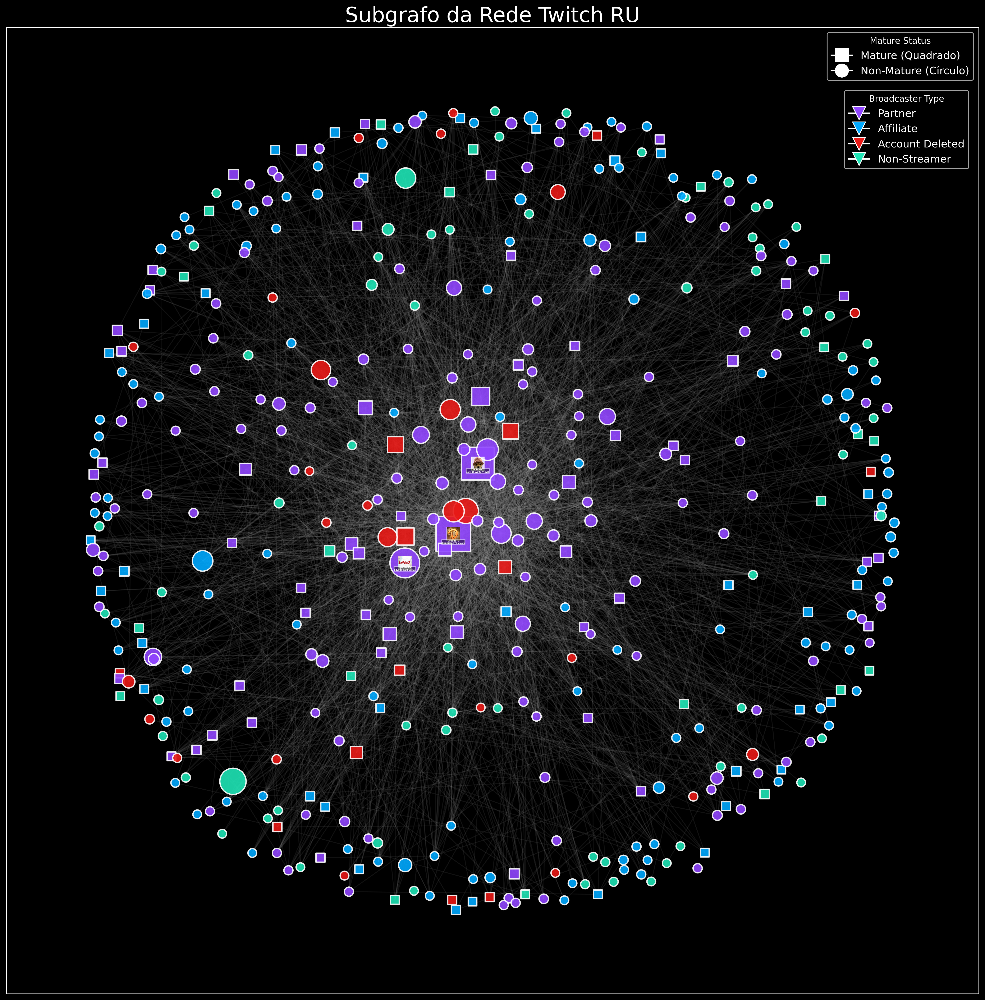

In [4]:
# Definir a percentagem de nós do grafo a utilizar
PercNodes = 7

TwitchVisualization.seeGraph(base_dir, edgePath, csv_path, PercNodes, country)

### Histograma das Variáveis

In [5]:
output_dir_hist = base_dir / 'docs' / "Imagens"
hist_folder = TwitchGraphs.create_subfolder('Histograms', output_dir_hist)

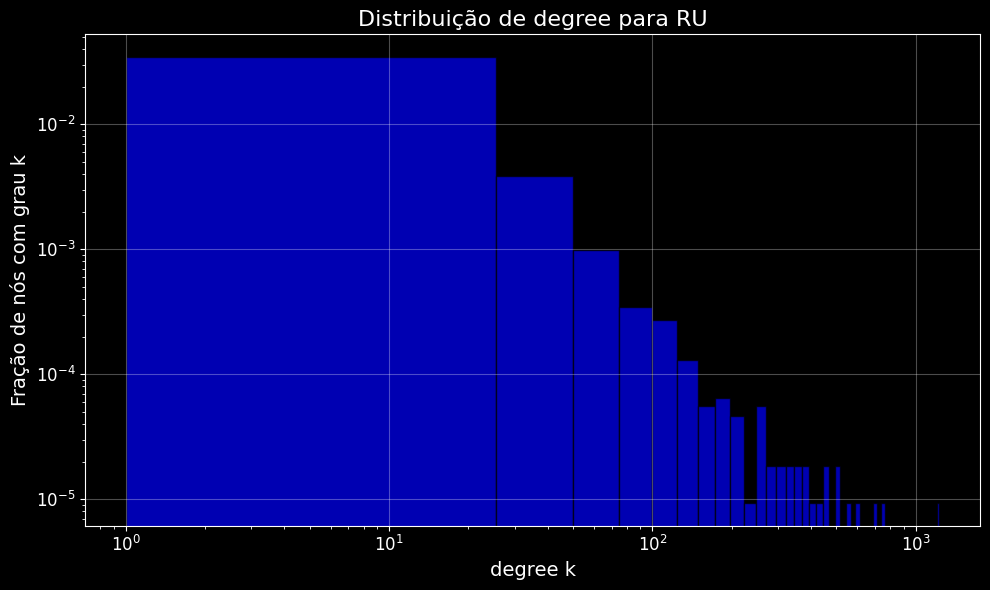

In [6]:
TwitchGraphs.plot_histogram(df = df, column_name = 'degree', color = 'blue', country = country, output_dir = output_dir_hist)

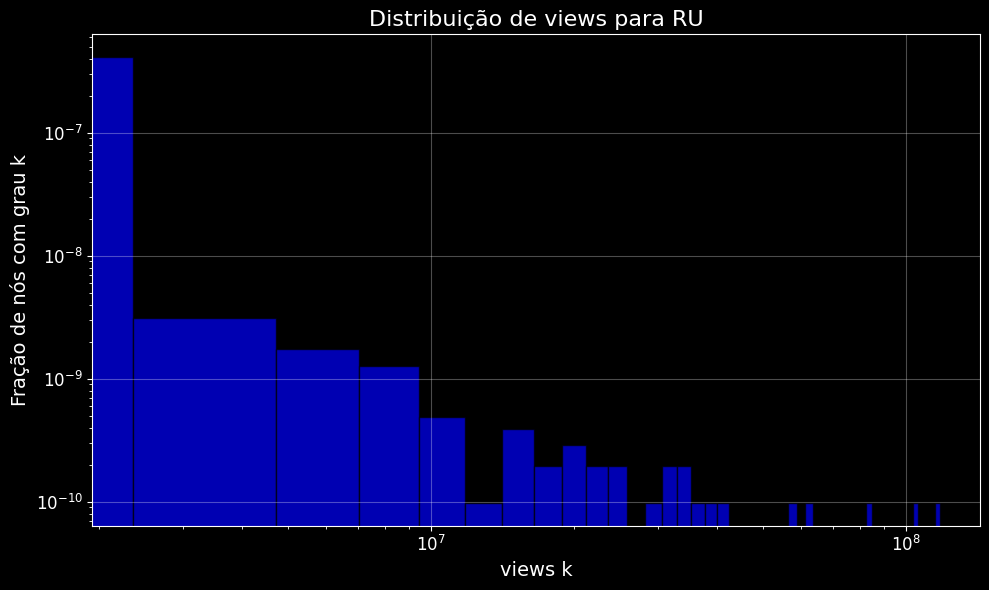

In [7]:
TwitchGraphs.plot_histogram(df = df, column_name = 'views', color = 'blue', country = country, output_dir = output_dir_hist)

### Power Law

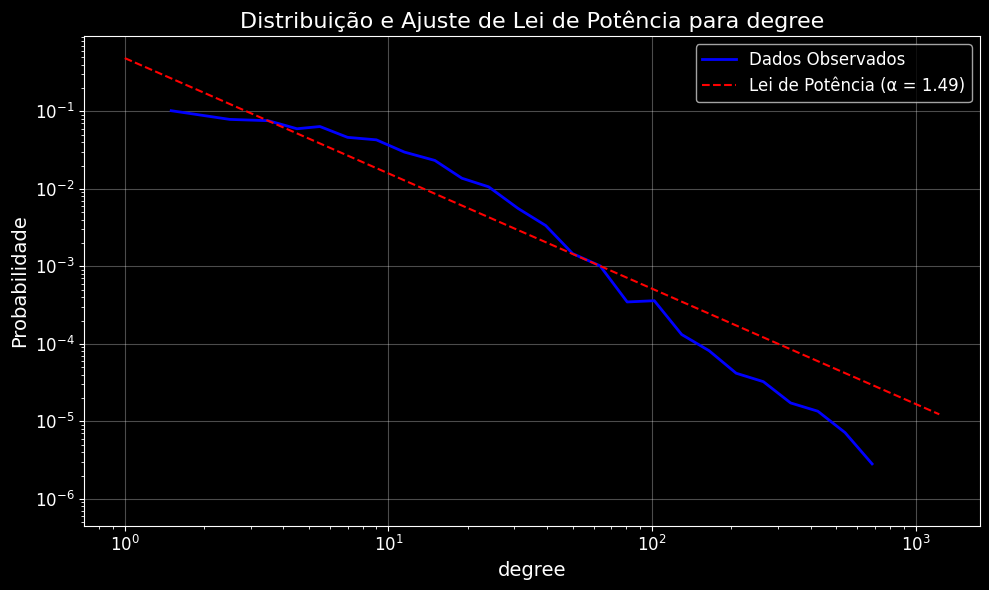

Expoente (α): 1.49
Valor mínimo (xmin): 1.0


In [8]:
alpha, xmin = TwitchGraphs.detect_power_law(df, 'degree', country, output_dir)
print(f"Expoente (α): {alpha:.2f}")
print(f"Valor mínimo (xmin): {xmin}")

Values less than or equal to 0 in data. Throwing out 0 or negative values


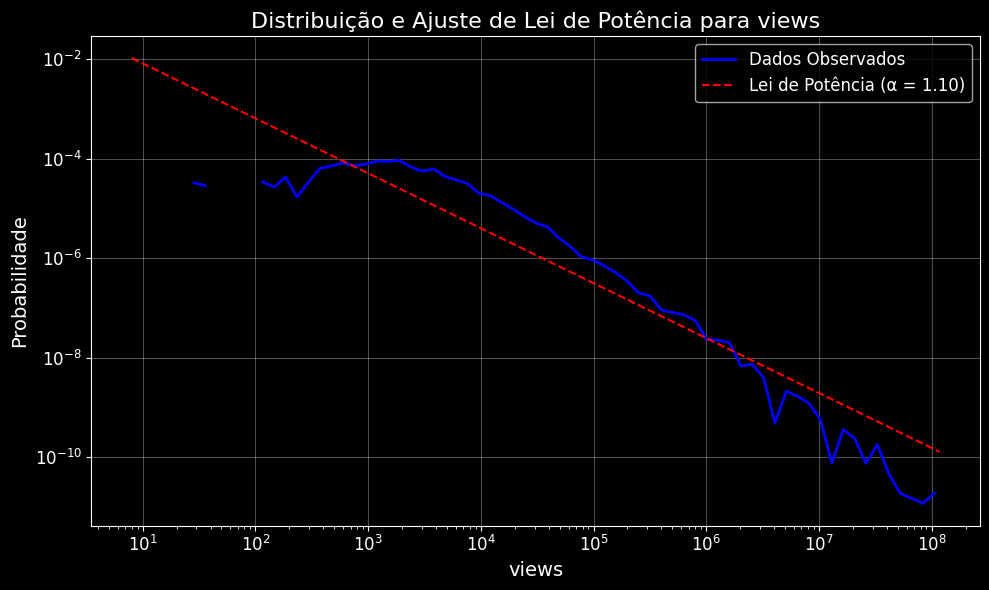

Expoente (α): 1.10
Valor mínimo (xmin): 1.0


In [9]:
alpha, xmin = TwitchGraphs.detect_power_law(df, 'views', country, output_dir)
print(f"Expoente (α): {alpha:.2f}")
print(f"Valor mínimo (xmin): {xmin}")

### PieChart das variáveis

game_name
Just Chatting                        439
Dota 2                               206
Counter-Strike                       122
World of Warcraft                    112
PUBG: BATTLEGROUNDS                   71
                                    ... 
Watch Dogs 2                           1
Need for Speed: Shift 2 Unleashed      1
ATLYSS                                 1
Cities: Skylines                       1
Bellwright                             1
Name: count, Length: 974, dtype: int64


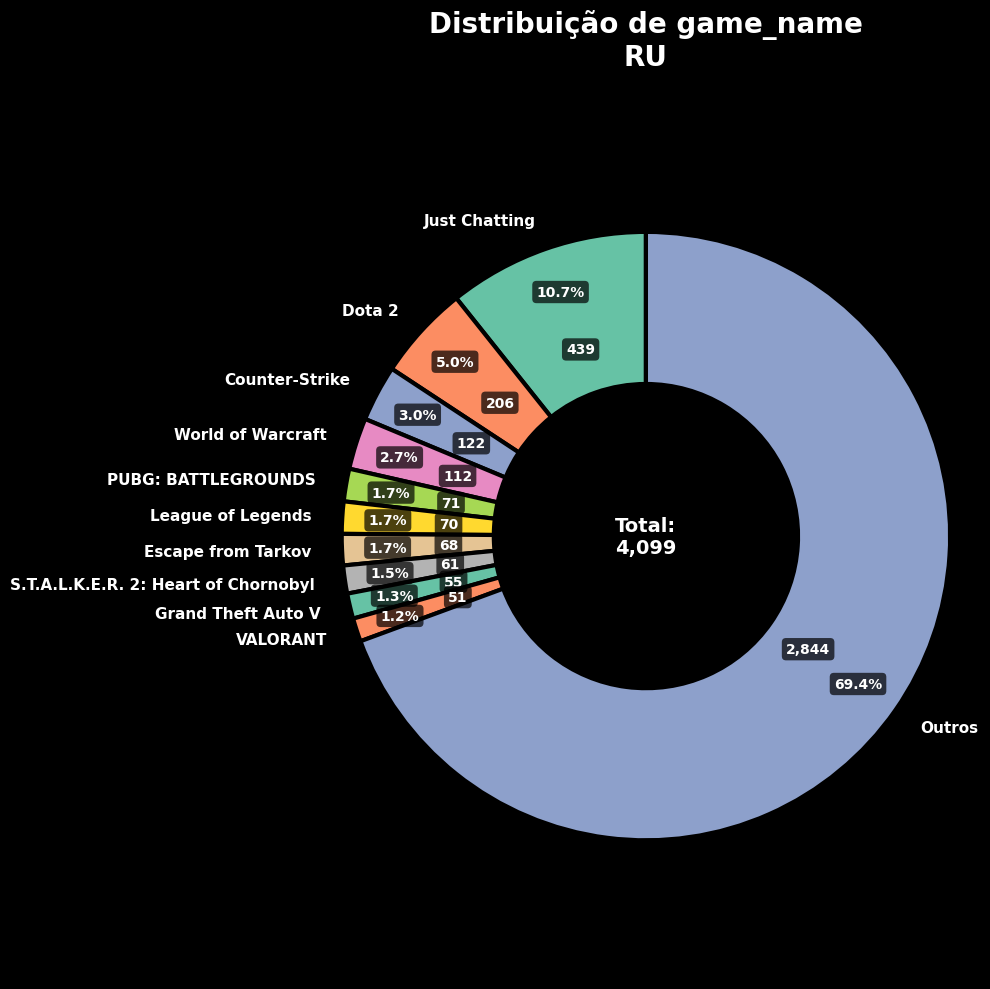

In [10]:
TwitchGraphs.plot_pie_chart(df = df, column_name = 'game_name', country = country, output_dir = output_dir)

mature
False    3310
True     1075
Name: count, dtype: int64


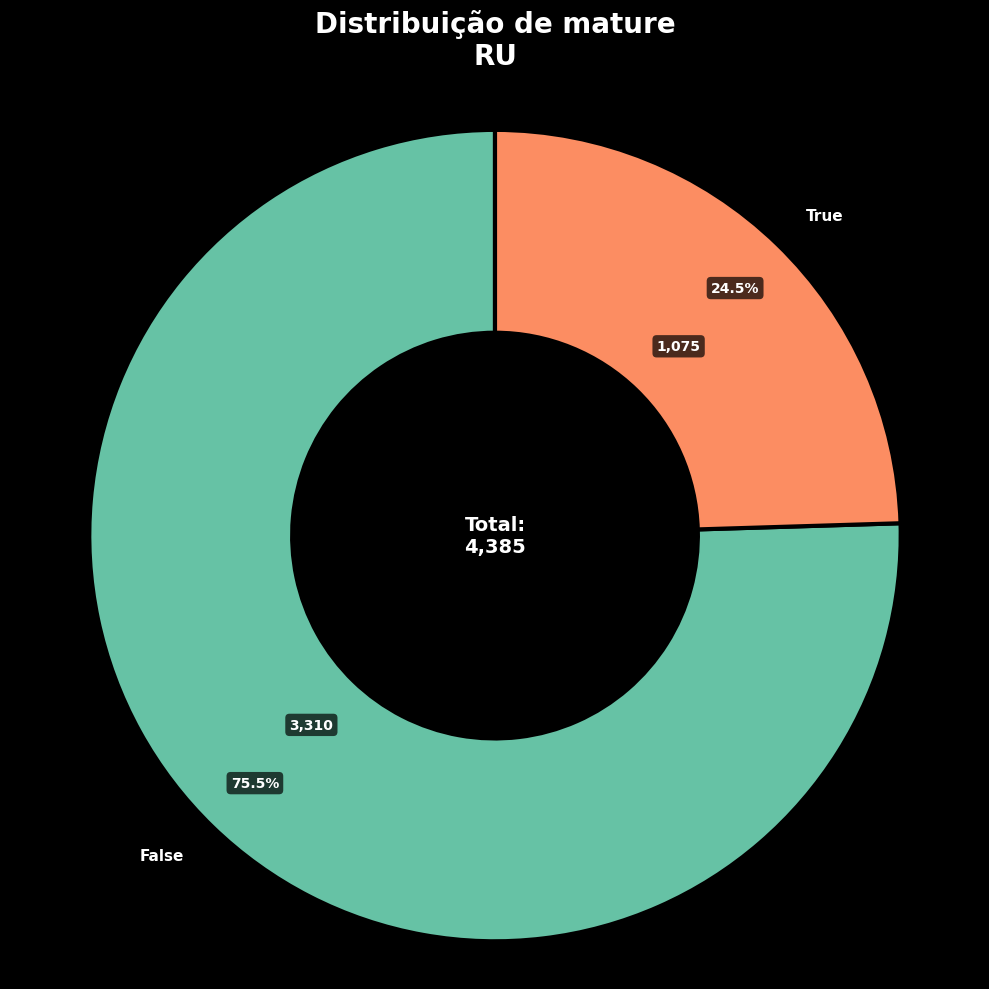

In [11]:
TwitchGraphs.plot_pie_chart(df = df, column_name = 'mature', country = country, output_dir = output_dir)

broadcaster_type
affiliate          2310
non_Streamer       1461
partner             392
account_Deleted     222
Name: count, dtype: int64


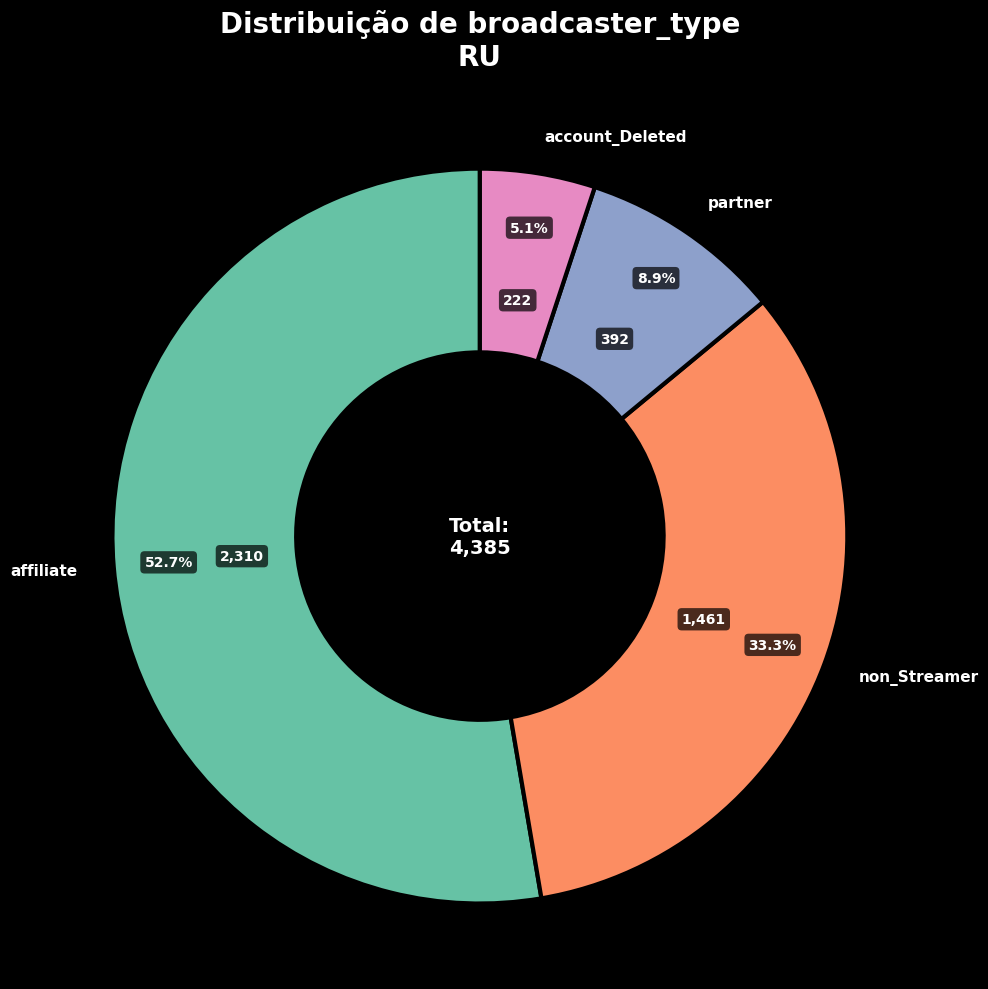

In [12]:
TwitchGraphs.plot_pie_chart(df = df, column_name = 'broadcaster_type', country = country, output_dir = output_dir)

### Comunidades

In [13]:
df

,node,degree,degree_centrality,closeness_centrality,betweenness_centrality,eigenvector_centrality,pagerank_centrality,clustering_coef,louvain_community,lp_community,...,days,mature,views,partner,new_id,username,created_at,profile_pic,broadcaster_type,game_name
0,1076,6,0.001369,0.308342,0.000468,0.001220,0.000143,0.133333,6,0,...,1910,False,2002,False,1076,Iggy5557,2013-05-17,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,World of Warcraft
1,1090,1,0.000228,0.256945,0.000000,0.000051,0.000050,0.000000,6,0,...,2273,True,1885,False,1090,AnnoArincass,2012-07-21,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Minion Masters
2,633,45,0.010265,0.392972,0.001281,0.016432,0.000529,0.105051,1,0,...,998,False,14538,False,633,Blifer,2016-01-16,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Sea of Thieves
3,2238,8,0.001825,0.372599,0.000172,0.008873,0.000125,0.250000,2,0,...,1738,True,8541,False,2238,Wape98,2014-01-07,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Mir Tankov
4,1662,11,0.002509,0.359846,0.000056,0.006519,0.000153,0.145455,3,0,...,1461,False,49854,False,1662,KaverTV,2014-10-12,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Project Zomboid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4380,3249,11,0.002509,0.325561,0.000003,0.003258,0.000140,0.545455,1,0,...,1267,False,31085,False,3249,JoystickNS,2015-04-23,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,VALORANT
4381,2287,14,0.003193,0.354005,0.000128,0.007035,0.000192,0.208791,0,0,...,1244,False,37971,False,2287,LoliRuri,2015-05-17,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Dave the Diver
4382,1095,8,0.001825,0.343789,0.000026,0.005328,0.000125,0.285714,2,0,...,663,False,24686,False,1095,vika_supernova,2016-12-18,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Bloodborne
4383,207,13,0.002965,0.332373,0.000237,0.003102,0.000196,0.089744,0,0,...,1885,False,12129,False,207,Wanzaro,2013-07-23,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,Blade & Soul


In [14]:
df['louvain_community'].unique()

array([ 6,  1,  2,  3,  0,  5, 11,  7,  8, 10,  9,  4])

In [15]:
df.columns

Index(['node', 'degree', 'degree_centrality', 'closeness_centrality',
       'betweenness_centrality', 'eigenvector_centrality',
       'pagerank_centrality', 'clustering_coef', 'louvain_community',
       'lp_community', 'id', 'days', 'mature', 'views', 'partner', 'new_id',
       'username', 'created_at', 'profile_pic', 'broadcaster_type',
       'game_name'],
      dtype='object')

<Figure size 1500x800 with 0 Axes>

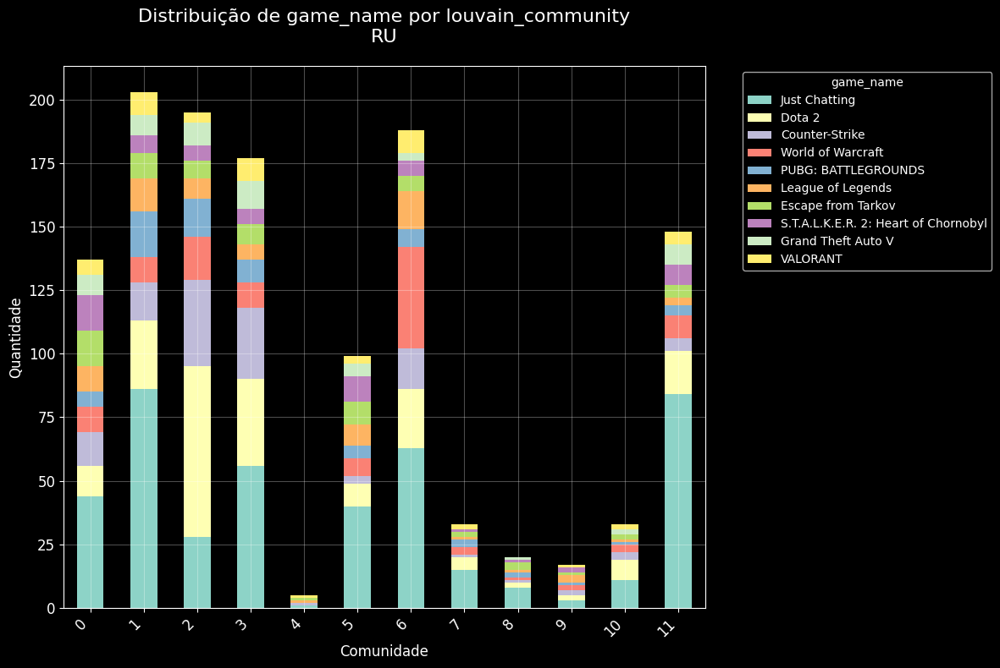

In [16]:
# Para ver distribuição de jogos por comunidade
TwitchGraphs.plot_community_distribution(df, 'game_name', 'louvain_community', country, output_dir)

<Figure size 1500x800 with 0 Axes>

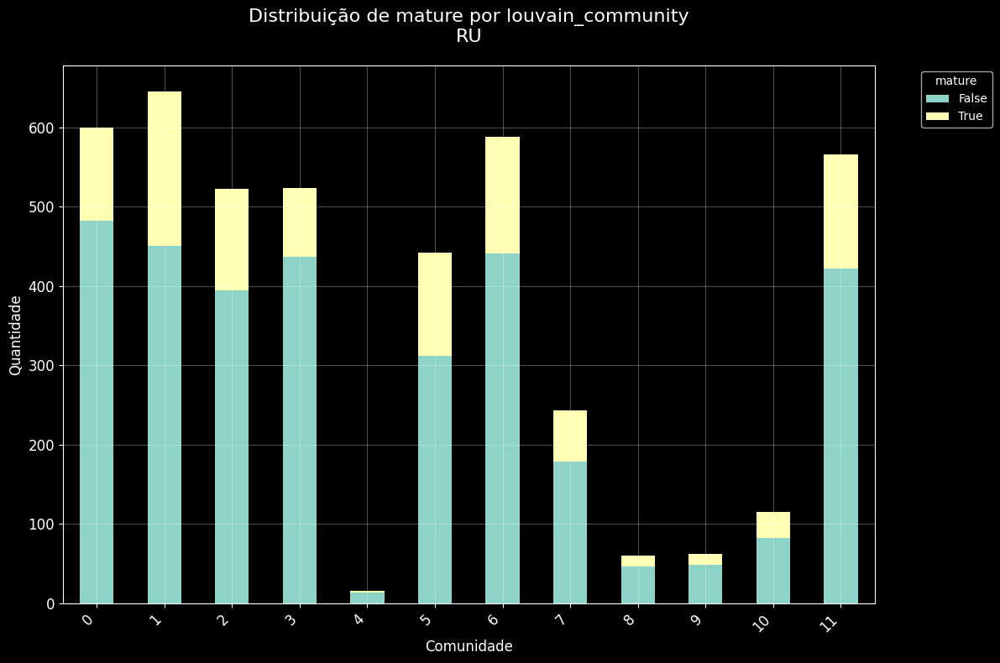

In [17]:
# Para ver distribuição de canais mature/non-mature por comunidade
TwitchGraphs.plot_community_distribution(df, 'mature', 'louvain_community', country, output_dir)

<Figure size 1500x800 with 0 Axes>

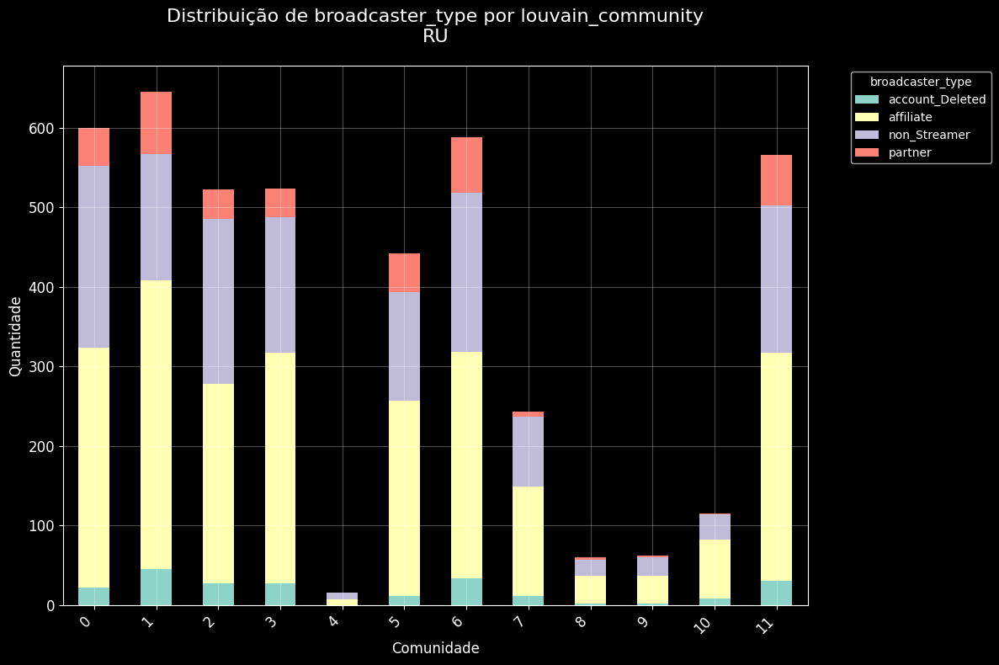

In [18]:
# Para ver distribuição de jogos por comunidade
TwitchGraphs.plot_community_distribution(df, 'broadcaster_type', 'louvain_community', country, output_dir)